In [1]:
# !pip3 install opencv-python
# !apt-get update && apt-get install libgl1

import os

import numpy as np
from netCDF4 import Dataset

import seaborn as sns
from tqdm import tqdm
from glob import glob
import pandas as pd
import time
import geopandas as gpd # GeoPandas(지오판다스)
import matplotlib.pyplot as plt
from rasterio.plot import show
import rasterio

import tensorflow as tf
import pickle

2023-05-15 08:43:46.164499: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-15 08:43:46.272874: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.


In [2]:
# path = os.getcwd()
# data_path = os.getcwd()
# proj_path = os.getcwd()
path = os.path.join("/workspace")
data_path = os.path.join(path,'cmaqProjectdata')

In [3]:
avg_conc_path_list = glob(os.path.join(data_path,"yearly_data","concentration","*"))
avg_conc_path_info_df = pd.DataFrame()
avg_conc_path_info_df.loc[:,'path'] = avg_conc_path_list
avg_conc_path_info_df.loc[:,'Run'] = [int(path.split("/")[-1].split(".")[1]) for path in avg_conc_path_list]

avg_ems_path_list = glob(os.path.join(data_path,"yearly_data","emission","*"))
avg_ems_path_info_df = pd.DataFrame()
avg_ems_path_info_df.loc[:,'path_ems'] = avg_ems_path_list
avg_ems_path_info_df.loc[:,'Run'] = [int(path.split("/")[-1].split(".")[1]) for path in avg_ems_path_list]

cont_matrix = pd.read_csv(os.path.join(data_path,"02_Emission_0518.csv"))

merged_info_df = pd.merge(avg_conc_path_info_df, avg_ems_path_info_df, how='left', on='Run')
merged_info_df = pd.merge(merged_info_df, cont_matrix, how='left', on='Run')
merged_info_df = merged_info_df.sort_values(by=['Run'])
merged_info_df.index = range(len(merged_info_df))

target_arr = np.concatenate([np.array(Dataset(path, 'r').variables['PM2_5'][0,0,:,:])[np.newaxis,:,:] for path in merged_info_df.path.tolist()])[:,:,:,None]

smoke_list = [Dataset(path, 'r') for path in merged_info_df.path_ems.tolist()]
smoke_chem_list = ['SO2', 'PM2_5', 'NOx', 'VOCs', 'NH3', 'CO']
smoke_val_list = []
for i in smoke_chem_list:
    smoke_arr_i = np.concatenate([np.array(Dataset(path, 'r').variables[i][0,0,:,:])[np.newaxis,:,:] for path in merged_info_df.path_ems.tolist()])[:,:,:,None]
    smoke_val_list.append(smoke_arr_i)

smoke_arr = np.concatenate(smoke_val_list, axis = 3)
smoke_arr.shape, target_arr.shape
input_cols = list(set(merged_info_df.columns) - set(['path','Run','path_ems']))

control_matrix = merged_info_df.loc[:,input_cols].values

In [4]:
control_matrix.shape, target_arr.shape, smoke_arr.shape

((120, 119), (120, 82, 67, 1), (120, 82, 67, 6))

In [5]:
ctp_rvn_gpd = gpd.GeoDataFrame.from_file(os.path.join(data_path,"geoinfodata","시도","ctp_rvn.shp",),encoding = 'cp949')
ctp_rvn_gpd.crs = {'init':'epsg:5179'}

/usr/local/lib/python3.8/dist-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [6]:
ctp_rvn_gpd.head()

,CTPRVN_CD,CTP_ENG_NM,CTP_KOR_NM,geometry
0,11,Seoul,서울특별시,"POLYGON ((966987.226 1941110.946, 966987.119 1..."
1,26,Busan,부산광역시,"MULTIPOLYGON (((1148194.981 1685460.055, 11481..."
2,27,Daegu,대구광역시,"POLYGON ((1087859.999 1760097.461, 1087859.951..."
3,28,Incheon,인천광역시,"MULTIPOLYGON (((847834.755 1881816.658, 847840..."
4,29,Gwangju,광주광역시,"POLYGON ((932712.687 1696168.692, 932781.680 1..."


In [7]:
# ctp_rvn_gpd.explore()

In [8]:
from shapely.geometry import Point
from copy import deepcopy

In [9]:
# lcc프로젝션 기본 레스터 제작
projout = '+proj=lcc +lat_1=30 +lat_2=60 +lon_1=126 +lat_0=38 +lon_0=126 +ellps=GRS80 +units=m'

# out_grid = make_geocube(vector_data=test_data, measurements=["습도(%)"], geom=geom,resolution=(9000, 9000), fill=0, output_crs=projout) #for most crs negative comes first in resolution
x_m = list(range(-180000,-180000 + 9000 * 67, 9000))
y_m = list(range(-585000,-585000 + 9000 * 82, 9000))

print(len(x_m), len(y_m))

grid_points = []
for x_i in x_m:
    for y_i in y_m:
        grid_points.append(Point(x_i,y_i))

grid_data = pd.DataFrame(grid_points, columns=['geometry'])

grid_data = gpd.GeoDataFrame(grid_data, geometry='geometry')
grid_data.crs = ctp_rvn_gpd.to_crs(projout).crs
grid_data.loc[:,'x_m'] = grid_data.geometry.x
grid_data.loc[:,'y_m'] = grid_data.geometry.y
grid_data.loc[:,'value'] = 0
grid_data.loc[:,'index'] = grid_data.index

# out_grid = make_geocube(vector_data=grid_data, measurements=["value"],resolution=(9000, 9000), fill=0, output_crs=projout) #for most crs negative comes first in resolution
# out_grid["value"].rio.to_raster("base_lcc.tif")


67 82


In [10]:
grid_data.head()

,geometry,x_m,y_m,value,index
0,POINT (-180000.000 -585000.000),-180000.0,-585000.0,0,0
1,POINT (-180000.000 -576000.000),-180000.0,-576000.0,0,1
2,POINT (-180000.000 -567000.000),-180000.0,-567000.0,0,2
3,POINT (-180000.000 -558000.000),-180000.0,-558000.0,0,3
4,POINT (-180000.000 -549000.000),-180000.0,-549000.0,0,4


In [11]:
joined = gpd.sjoin(ctp_rvn_gpd, grid_data.to_crs(5179), op='contains')
indexed_grid_point = pd.merge(grid_data, joined.loc[:,['CTPRVN_CD', 'CTP_ENG_NM', 'CTP_KOR_NM', 'index_right']], how='left', left_on='index', right_on='index_right')
indexed_grid_point = gpd.GeoDataFrame(indexed_grid_point, geometry='geometry')

/usr/local/lib/python3.8/dist-packages/IPython/core/interactiveshell.py:3400: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if await self.run_code(code, result, async_=asy):
/tmp/ipykernel_3791518/1405158965.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: +init=epsg:5179 +type=crs
Right CRS: EPSG:5179

  joined = gpd.sjoin(ctp_rvn_gpd, grid_data.to_crs(5179), op='contains')


<Axes: >

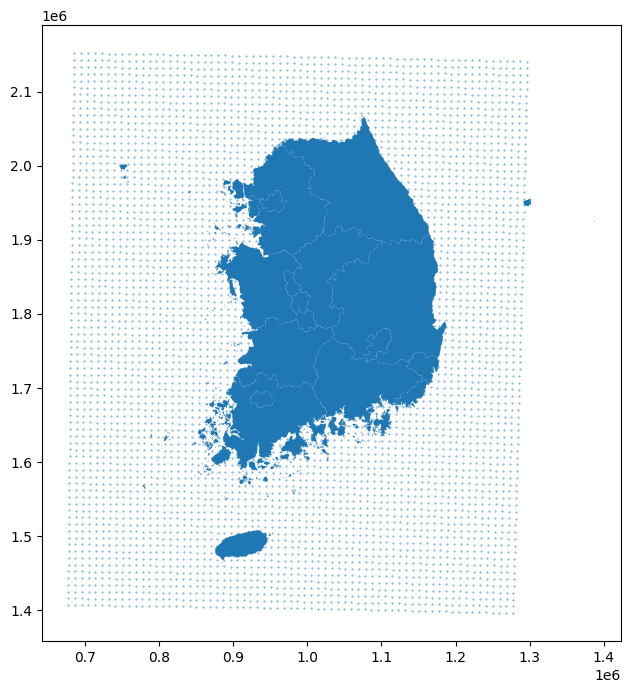

In [12]:
fig, ax = plt.subplots(figsize=(8, 8))
indexed_grid_point.to_crs(5179).plot(ax = ax, markersize = 0.1)
ctp_rvn_gpd.plot(ax = ax)

In [13]:
indexed_grid_point

,geometry,x_m,y_m,value,index,CTPRVN_CD,CTP_ENG_NM,CTP_KOR_NM,index_right
0,POINT (-180000.000 -585000.000),-180000.0,-585000.0,0,0,NaN,NaN,NaN,NaN
1,POINT (-180000.000 -576000.000),-180000.0,-576000.0,0,1,NaN,NaN,NaN,NaN
2,POINT (-180000.000 -567000.000),-180000.0,-567000.0,0,2,NaN,NaN,NaN,NaN
3,POINT (-180000.000 -558000.000),-180000.0,-558000.0,0,3,NaN,NaN,NaN,NaN
4,POINT (-180000.000 -549000.000),-180000.0,-549000.0,0,4,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
5489,POINT (414000.000 108000.000),414000.0,108000.0,0,5489,NaN,NaN,NaN,NaN
5490,POINT (414000.000 117000.000),414000.0,117000.0,0,5490,NaN,NaN,NaN,NaN
5491,POINT (414000.000 126000.000),414000.0,126000.0,0,5491,NaN,NaN,NaN,NaN
5492,POINT (414000.000 135000.000),414000.0,135000.0,0,5492,NaN,NaN,NaN,NaN


* 한 샘플 정리하는 방식 체크

In [14]:
## 스모크 5채널 각 컬럼으로 값 넣어주기 (루프돌리면 가능할듯), ex: voc_value, sox_value, nox_value 등등...
smoke_indexed_grid_point = deepcopy(indexed_grid_point)


In [15]:
for i, pre_cor in enumerate(smoke_chem_list):
    sub_smoke_arr = smoke_arr[0][:,:,i]  # 0번째 데이터셋만 체크

    for pix_index in smoke_indexed_grid_point.index.tolist():
        x, y = pix_index%82,pix_index//82
        smoke_indexed_grid_point.loc[pix_index,pre_cor] = sub_smoke_arr[x,y]


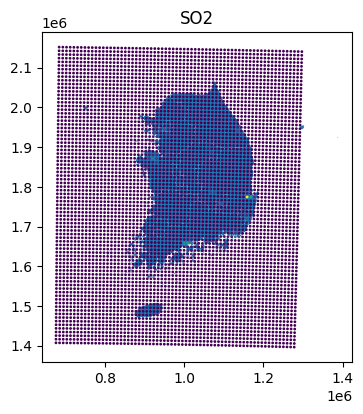

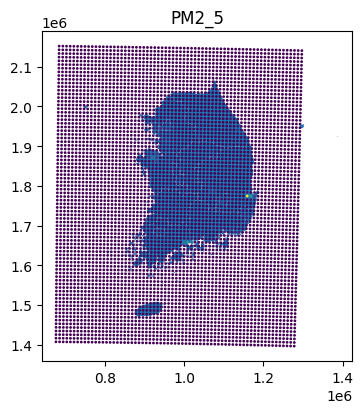

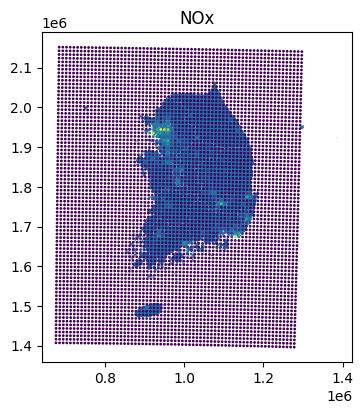

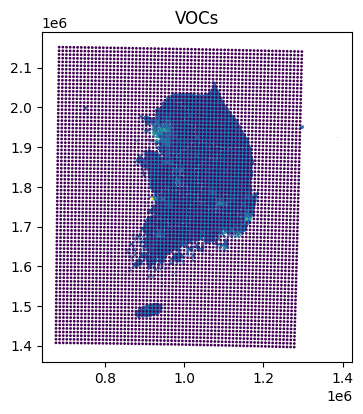

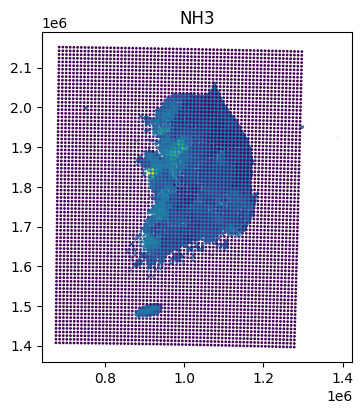

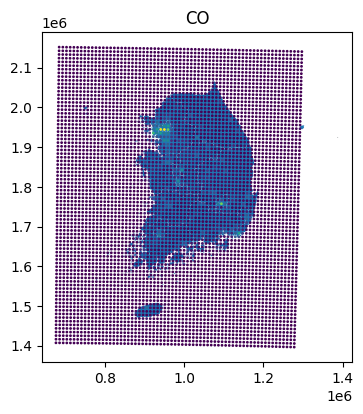

In [16]:
for i,chem in enumerate(smoke_chem_list):
    plt.figure(figsize = [5,30])
    sub_ax = plt.subplot(6,1,i+1)
    plt.title(chem)
    ctp_rvn_gpd.plot(ax = sub_ax)
    smoke_indexed_grid_point.to_crs(5179).plot(ax = sub_ax,markersize = 1,column = chem)

    # ctp_rvn_gpd.plot(ax = ax)
    # smoke_indexed_grid_point.to_crs(5179).plot(ax = ax, markersize = 1,column = chem)


In [17]:
sub_pd = smoke_indexed_grid_point.loc[:,['CTP_KOR_NM','SO2','PM2_5','NOx','VOCs','NH3','CO']].groupby(['CTP_KOR_NM']).sum()
sub_pd

,SO2,PM2_5,NOx,VOCs,NH3,CO
CTP_KOR_NM,,,,,,
강원도,3.120509,131.372321,25.357681,9.168516,18.101617,43.800004
경기도,3.705135,280.528584,141.539928,62.006031,77.899047,117.779803
경상남도,2.795623,153.059488,52.208188,30.389833,40.257457,54.344576
경상북도,14.026183,622.415725,70.514909,30.605408,53.777117,98.551054
광주광역시,0.165665,18.362498,9.620086,5.285473,2.506954,9.743126
대구광역시,1.120527,40.034534,20.312345,8.393245,4.580827,20.342817
대전광역시,0.197989,19.276084,11.587972,4.886417,2.256292,12.352862
부산광역시,3.363916,70.108743,34.326415,11.489367,3.708785,21.326978
서울특별시,2.252121,82.017170,56.947334,22.637771,7.179526,52.838930


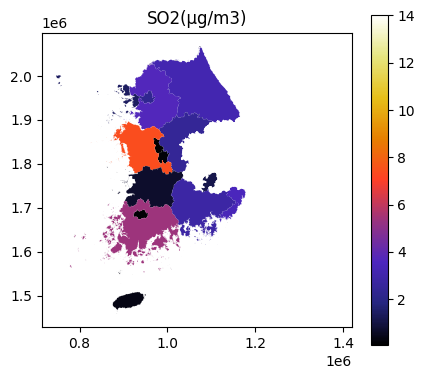

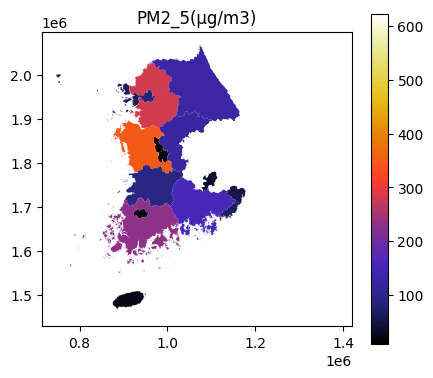

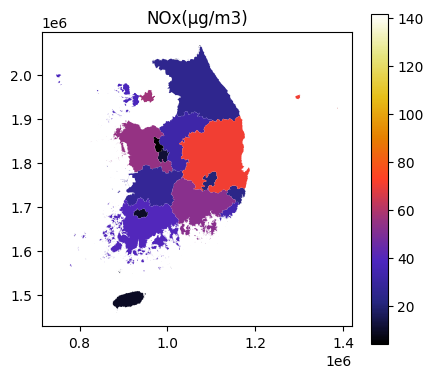

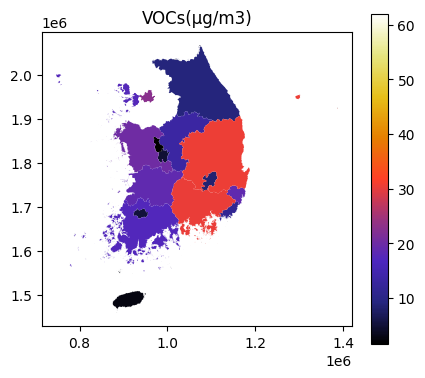

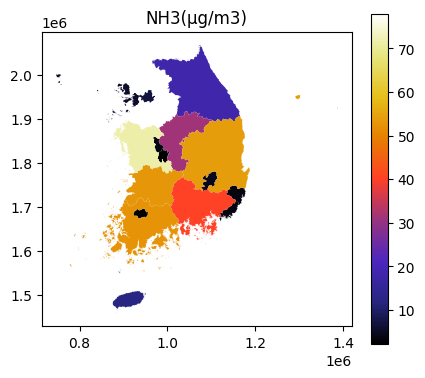

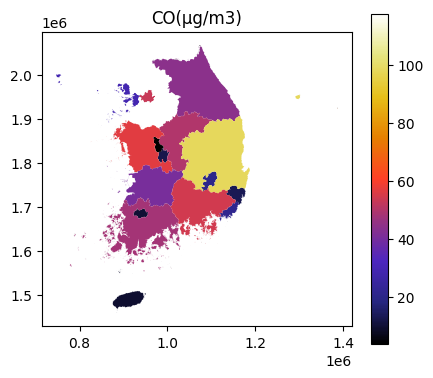

In [18]:

i=1
for chem in smoke_chem_list:
    plt.figure(figsize = [5,30])
    sub_ax = plt.subplot(6,1,i)
    plt.title(chem + '(μg/m3)')

    temp_pd = sub_pd.loc[:,[chem]]
    temp_pd.loc[:,'CTP_KOR_NM'] = temp_pd.index
    temp_pd.index = range(len(temp_pd))

    temp_pd_2 = pd.merge(ctp_rvn_gpd, temp_pd, how = 'left', on='CTP_KOR_NM')
    temp_pd_2.plot(column=chem, legend=True, ax=sub_ax, cmap='CMRmap')

    i+=1

In [19]:
sub_pd2 = sub_pd.stack().reset_index()
sub_pd2.columns = ['CTP_KOR_NM', 'Pollutant', 'Value']

sub_pd2['New_Column'] = sub_pd2['CTP_KOR_NM'] + '_' + sub_pd2['Pollutant']
sub_pd2 = sub_pd2.drop(columns=['CTP_KOR_NM', 'Pollutant'])
sub_pd2 = sub_pd2.iloc[:,[1,0]].T
sub_pd2.columns = sub_pd2.iloc[0,:].values
sub_pd2 = sub_pd2.iloc[1:2,:]
sub_pd2.index = range(len(sub_pd2))
sub_pd2

,강원도_SO2,강원도_PM2_5,강원도_NOx,강원도_VOCs,강원도_NH3,강원도_CO,경기도_SO2,경기도_PM2_5,경기도_NOx,경기도_VOCs,...,충청남도_NOx,충청남도_VOCs,충청남도_NH3,충청남도_CO,충청북도_SO2,충청북도_PM2_5,충청북도_NOx,충청북도_VOCs,충청북도_NH3,충청북도_CO
0,3.120509,131.372321,25.357681,9.168516,18.101617,43.800004,3.705135,280.528584,141.539928,62.006031,...,55.082021,20.169763,71.620154,56.410535,2.437223,127.265602,32.07175,13.324118,31.487557,49.931513


* 전체 데이터셋 정리

In [20]:
pd_reformed_list = []
for run in range(len(smoke_arr)):
    ## 스모크 5채널 각 컬럼으로 값 넣어주기 (루프돌리면 가능할듯), ex: voc_value, sox_value, nox_value 등등...
    smoke_indexed_grid_point = deepcopy(indexed_grid_point)

    for i, pre_cor in enumerate(smoke_chem_list):
        sub_smoke_arr = smoke_arr[run][:,:,i]  #

        for pix_index in smoke_indexed_grid_point.index.tolist():
            x, y = pix_index%82,pix_index//82
            smoke_indexed_grid_point.loc[pix_index,pre_cor] = sub_smoke_arr[x,y]
    
    sub_pd = smoke_indexed_grid_point.loc[:,['CTP_KOR_NM','SO2','PM2_5','NOx','VOCs','NH3','CO']].groupby(['CTP_KOR_NM']).sum()

    sub_pd2 = sub_pd.stack().reset_index()
    sub_pd2.columns = ['CTP_KOR_NM', 'Pollutant', 'Value']

    sub_pd2['New_Column'] = sub_pd2['CTP_KOR_NM'] + '_' + sub_pd2['Pollutant']
    sub_pd2 = sub_pd2.drop(columns=['CTP_KOR_NM', 'Pollutant'])
    sub_pd2 = sub_pd2.iloc[:,[1,0]].T
    sub_pd2.columns = sub_pd2.iloc[0,:].values
    sub_pd2 = sub_pd2.iloc[1:2,:]
    sub_pd2.index = range(len(sub_pd2))

    pd_reformed_list.append(sub_pd2)

r_smoke_dataset = pd.concat(pd_reformed_list, axis=0)
r_smoke_dataset.index = range(len(r_smoke_dataset)+1)[1:]
r_smoke_dataset


,강원도_SO2,강원도_PM2_5,강원도_NOx,강원도_VOCs,강원도_NH3,강원도_CO,경기도_SO2,경기도_PM2_5,경기도_NOx,경기도_VOCs,...,충청남도_NOx,충청남도_VOCs,충청남도_NH3,충청남도_CO,충청북도_SO2,충청북도_PM2_5,충청북도_NOx,충청북도_VOCs,충청북도_NH3,충청북도_CO
1,3.120509,131.372321,25.357681,9.168516,18.101617,43.800004,3.705135,280.528584,141.539928,62.006031,...,55.082021,20.169763,71.620154,56.410535,2.437223,127.265602,32.07175,13.324118,31.487557,49.931513
2,3.335509,132.696815,16.965365,7.196474,20.684323,40.298278,4.240015,338.079203,187.768766,60.782175,...,44.441355,16.156248,70.976202,45.110597,2.39263,114.097711,25.952847,10.96934,18.755701,50.664475
3,3.335509,132.696815,16.965365,7.196474,20.684323,40.298278,4.240015,338.079203,187.768766,60.782175,...,44.441355,16.156248,70.976202,45.110597,2.39263,114.097711,25.952847,10.96934,18.755701,50.664475
4,3.230738,115.664008,23.024749,6.21048,17.524073,31.746024,3.13245,295.728485,129.883803,41.69298,...,62.877901,20.148633,77.572073,62.123532,3.028121,120.973602,21.745237,15.442972,32.995357,45.72936
5,3.704893,126.974999,21.749127,9.493573,17.251804,42.010789,4.182594,218.850242,133.323479,70.213085,...,61.119484,18.079978,93.71287,57.409277,3.008282,140.916518,34.647121,12.629633,29.610503,49.133737
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116,3.248033,153.541315,31.549869,11.410441,18.8679,46.832701,3.635968,268.110769,116.847984,54.696768,...,40.666835,19.163339,97.783393,45.452091,2.483629,102.415569,21.157685,10.967111,34.843861,33.56502
117,2.966474,144.877701,27.946752,7.686564,25.528532,48.000451,3.243398,254.581058,90.320227,66.601199,...,35.564161,17.732124,49.055581,56.486642,2.118013,117.839027,24.103482,15.099273,41.085796,47.645758
118,3.659707,148.522818,18.288098,8.669395,22.724584,46.926564,3.241991,282.240041,165.678991,79.865184,...,70.338987,26.649339,86.632775,67.892284,2.822168,153.272856,41.635573,13.625658,30.305793,53.622117
119,3.807341,147.178412,18.971989,9.997189,25.630849,43.884352,4.157449,202.232451,94.024704,72.816405,...,63.373937,22.745567,54.085072,58.220476,3.259486,135.675698,32.614671,13.076097,18.176632,54.899736


In [21]:
# 베이스스모크 기반으로 펼치기(가중치느낌으로)
base_smoke = smoke_arr[0]

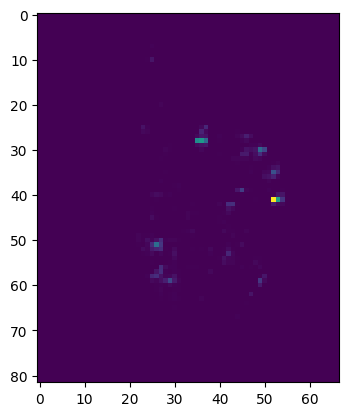

In [22]:
plt.imshow(base_smoke[:,:,0])

In [23]:
# 스모크 형태 빈 어레이 생성
# 인덱스 순서대로 루프
# 인덱스에 해당하는 indexed_grid_point에서 시도정보 얻기
# 해당 시도와 컬럼에 해당하는 r_smoke_dataset에서 값얻기, (basesmoke(해당그리드값)/시도전체 합) * r_smoke로 해당 그리드 값 할당
# 6개 화학물질에 대해 모두 시행

In [24]:
indexed_grid_point

,geometry,x_m,y_m,value,index,CTPRVN_CD,CTP_ENG_NM,CTP_KOR_NM,index_right
0,POINT (-180000.000 -585000.000),-180000.0,-585000.0,0,0,NaN,NaN,NaN,NaN
1,POINT (-180000.000 -576000.000),-180000.0,-576000.0,0,1,NaN,NaN,NaN,NaN
2,POINT (-180000.000 -567000.000),-180000.0,-567000.0,0,2,NaN,NaN,NaN,NaN
3,POINT (-180000.000 -558000.000),-180000.0,-558000.0,0,3,NaN,NaN,NaN,NaN
4,POINT (-180000.000 -549000.000),-180000.0,-549000.0,0,4,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
5489,POINT (414000.000 108000.000),414000.0,108000.0,0,5489,NaN,NaN,NaN,NaN
5490,POINT (414000.000 117000.000),414000.0,117000.0,0,5490,NaN,NaN,NaN,NaN
5491,POINT (414000.000 126000.000),414000.0,126000.0,0,5491,NaN,NaN,NaN,NaN
5492,POINT (414000.000 135000.000),414000.0,135000.0,0,5492,NaN,NaN,NaN,NaN


In [ ]:
#
r_smoke_to_smoke_shape_list = []

for i in r_smoke_dataset.index.tolist():

    chem_base = np.zeros_like(base_smoke)
    for i_c, i_chem in enumerate(smoke_chem_list):

        
        for pix_index in indexed_grid_point.loc[~indexed_grid_point.CTP_KOR_NM.isna()].index.tolist():
            x, y = pix_index%82,pix_index//82

            region_str = indexed_grid_point.loc[pix_index,'CTP_KOR_NM']
            sum_chem_value = r_smoke_dataset.loc[i, region_str + '_' + i_chem]  # i번시나리오 테스트
            base_smoke_r_sum = r_smoke_dataset.loc[1, region_str + '_' + i_chem]  # 베이스 시나리오이므로 1번 고정
            base_smkoe_r_i_value = base_smoke[x,y,i_c]

            i_value = sum_chem_value * (base_smkoe_r_i_value / base_smoke_r_sum)

            chem_base[x,y,i_c] = i_value
    
    r_smoke_to_smoke_shape_list.append(chem_base)
    print(i)

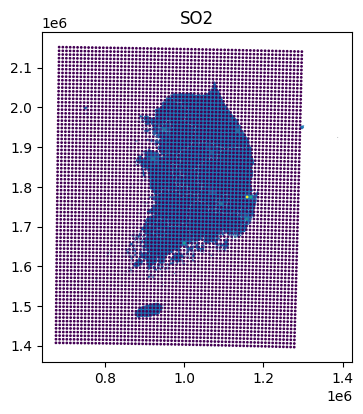

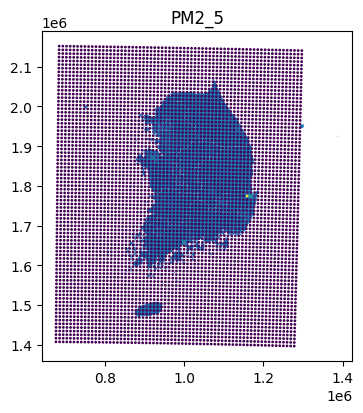

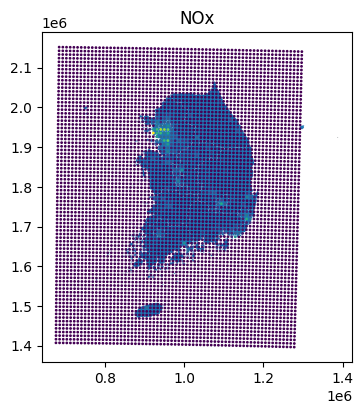

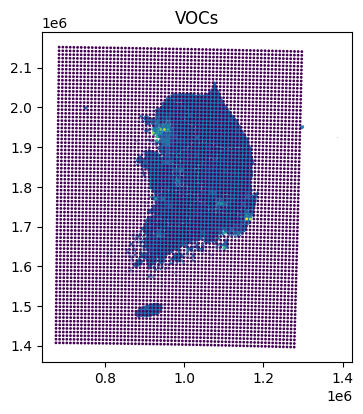

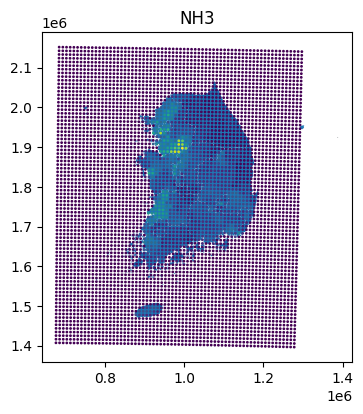

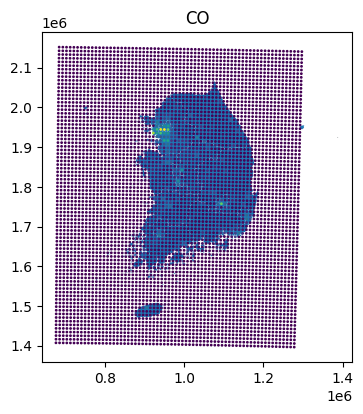

In [26]:
# 10번 시나리오만 체크
smoke_indexed_grid_point = deepcopy(indexed_grid_point)
s_ind = 10

for i, pre_cor in enumerate(smoke_chem_list):
    sub_smoke_arr = r_smoke_to_smoke_shape_list[s_ind][:,:,i]

    for pix_index in smoke_indexed_grid_point.index.tolist():
        x, y = pix_index%82,pix_index//82
        smoke_indexed_grid_point.loc[pix_index,pre_cor] = sub_smoke_arr[x,y]

for i,chem in enumerate(smoke_chem_list):
    plt.figure(figsize = [5,30])
    sub_ax = plt.subplot(6,1,i+1)
    plt.title(chem)
    ctp_rvn_gpd.plot(ax = sub_ax)
    smoke_indexed_grid_point.to_crs(5179).plot(ax = sub_ax,markersize = 1,column = chem)

    # ctp_rvn_gpd.plot(ax = ax)
    # smoke_indexed_grid_point.to_crs(5179).plot(ax = ax, markersize = 1,column = chem)


* 모델 피팅

In [27]:
BATCH_SIZE = 8
EPOCH = 1
shuffle_buffer_size = 100
train_set_len = 100

INPUT_SHAPE = [119]
OUTPUT_CHANNELS = 1

In [28]:
train_input = r_smoke_to_smoke_shape_list[:train_set_len]
test_input = r_smoke_to_smoke_shape_list[train_set_len:]

train_output = target_arr[:train_set_len]
test_output = target_arr[train_set_len:]

train_input_ds = tf.data.Dataset.from_tensor_slices(train_input)
train_target_ds = tf.data.Dataset.from_tensor_slices(train_output)

test_input_ds = tf.data.Dataset.from_tensor_slices(test_input)
test_target_ds = tf.data.Dataset.from_tensor_slices(test_output)

train_ds = tf.data.Dataset.zip((train_input_ds, train_target_ds)).batch(BATCH_SIZE).shuffle(shuffle_buffer_size)
test_ds = tf.data.Dataset.zip((test_input_ds, test_target_ds)).batch(BATCH_SIZE).shuffle(shuffle_buffer_size)

test_input_reshaped = np.concatenate(test_input).reshape(-1,82,67,6)
train_input_reshaped = np.concatenate(train_input).reshape(-1,82,67,6)

2023-05-15 08:48:45.463107: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-15 08:48:47.379328: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 22275 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:19:00.0, compute capability: 8.6
2023-05-15 08:48:47.379981: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 22275 MB memory:  -> device: 1, name: NVIDIA GeForce RTX 3090, pci bus id: 0000:1a:00.0, compute capability: 8.6
2023-05-15 08:48:47.380463: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1613] Created device /job:localho

In [29]:
class CBR2d(tf.keras.layers.Layer):
    def __init__(self, out_channels,kernel_size = 3):
        super(CBR2d, self).__init__()
        self.cnn_layer = tf.keras.layers.Conv2D(out_channels, kernel_size, activation='relu', padding='same')
        self.batch_layer = tf.keras.layers.BatchNormalization()
              
    def call(self, inputs):
        cnn_feat_x = self.cnn_layer(inputs)
        batched_feat = self.batch_layer(cnn_feat_x)
        return batched_feat

class Unet(tf.keras.Model): 
    def __init__(self,): 
        super(Unet, self).__init__()

        self.input_resize_layer = tf.keras.layers.Resizing(
            256,
            256,
            interpolation='bilinear',
            crop_to_aspect_ratio=False,
        )

        self.output_resize_layer = tf.keras.layers.Resizing(
            82,
            67,
            interpolation='bilinear',
            crop_to_aspect_ratio=False,
        )

        self.enc1_1 = CBR2d(out_channels = 64) 
        self.enc1_2 = CBR2d(out_channels=64)
            
        self.pool1 = tf.keras.layers.MaxPool2D(pool_size=(2,2), )
        
        self.enc2_1 = CBR2d(out_channels=128)
        self.enc2_2 = CBR2d(out_channels=128)
        
        self.pool2 = tf.keras.layers.MaxPool2D(pool_size=(2,2), )
        
        self.enc3_1 = CBR2d(out_channels=256)
        self.enc3_2 = CBR2d(out_channels=256)
        self.pool3 = tf.keras.layers.MaxPool2D(pool_size=(2,2), )

        self.enc4_1 = CBR2d(out_channels=512)
        self.enc4_2 = CBR2d(out_channels=512)
        self.pool4 = tf.keras.layers.MaxPool2D(pool_size=(2,2), )
        
        
        self.enc5_1 = CBR2d(out_channels=1024)
        self.dec5_1 = CBR2d(out_channels=512)

        self.unpool4 = tf.keras.layers.Conv2DTranspose(filters=512, kernel_size=2,strides=(2, 2))

        self.dec4_2 = CBR2d(out_channels=512)
        self.dec4_1 = CBR2d(out_channels=256)

        self.unpool3 = tf.keras.layers.Conv2DTranspose(filters=256, kernel_size=2,strides=(2, 2))

        self.dec3_2 = CBR2d(out_channels=256)
        self.dec3_1 = CBR2d(out_channels=128)

        self.unpool2 = tf.keras.layers.Conv2DTranspose(filters=128, kernel_size=2,strides=(2, 2))

        self.dec2_2 = CBR2d(out_channels=128)
        self.dec2_1 = CBR2d(out_channels=64)

        self.unpool1 = tf.keras.layers.Conv2DTranspose(filters=64, kernel_size=2,strides=(2, 2))

        self.dec1_2 = CBR2d(out_channels=64)
        self.dec1_1 = CBR2d(out_channels=64)

        self.outlayer = tf.keras.layers.Conv2D(1,kernel_size = 1)
              
    def call(self, input): 

        input = self.input_resize_layer(input)
      
        enc1_1 = self.enc1_1(input)
        enc1_2 = self.enc1_2(enc1_1)
        
        pool1 = self.pool1(enc1_2)

        enc2_1 = self.enc2_1(pool1)
        enc2_2 = self.enc2_2(enc2_1)
        
        pool2= self.pool2(enc2_2)
  
        enc3_1 = self.enc3_1(pool2)
        enc3_2 = self.enc3_2(enc3_1)
        
        pool3= self.pool3(enc3_2)

        enc4_1 = self.enc4_1(pool3)
        enc4_2 = self.enc4_2(enc4_1)
        
        pool4= self.pool3(enc4_2)

        enc5_1 = self.enc5_1(pool4)
        
        dec5_1 = self.dec5_1(enc5_1)
        

        unpool4 = self.unpool4(dec5_1)

        cat4 = tf.keras.layers.Concatenate(axis=3)([unpool4, enc4_2]) # dim = [0:batch, 1:channel, 2:height, 3:width]
        
        dec4_2 = self.dec4_2(cat4)
        dec4_1 = self.dec4_1(dec4_2)
       
        unpool3 = self.unpool3(dec4_1)
    
        cat3 = tf.keras.layers.Concatenate(axis=3)([unpool3, enc3_2]) # dim = [0:batch, 1:channel, 2:height, 3:width]
        dec3_2 = self.dec3_2(cat3)
        dec3_1 = self.dec3_1(dec3_2)
        
        unpool2 = self.unpool2(dec3_1)
        
        cat2 = tf.keras.layers.Concatenate(axis=3)([unpool2, enc2_2]) # dim = [0:batch, 1:channel, 2:height, 3:width]
        dec2_2 = self.dec2_2(cat2)
        dec2_1 = self.dec2_1(dec2_2)
        
        unpool1 = self.unpool1(dec2_1)
        
        cat1 = tf.keras.layers.Concatenate(axis=3)([unpool1, enc1_2]) # dim = [0:batch, 1:channel, 2:height, 3:width]
        dec1_2 = self.dec1_2(cat1)
        dec1_1 = self.dec1_1(dec1_2)
        
        x = self.outlayer(dec1_1)

        x = self.output_resize_layer(x)
        return x

In [30]:
def scheduler(epoch, learning_rate):
    if epoch < 100:
        return 0.0001
    else:
        return 0.0001/10 


net_1 = Unet()

initial_learning_rate = 0.0001
callback = tf.keras.callbacks.LearningRateScheduler(scheduler, verbose=1)
optimizer_1 = tf.keras.optimizers.Adam(initial_learning_rate)

net_1.compile(optimizer=optimizer_1, loss="mse")

In [31]:
net_1.fit(train_input_reshaped, train_output, epochs=300, batch_size=10, shuffle=True, verbose=2, callbacks=[callback])


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/300


2023-05-15 08:49:04.809255: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8101
2023-05-15 08:49:08.270312: I tensorflow/compiler/xla/service/service.cc:173] XLA service 0x7f3667f8f800 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-05-15 08:49:08.270333: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (0): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2023-05-15 08:49:08.270337: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (1): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2023-05-15 08:49:08.270340: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (2): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2023-05-15 08:49:08.270344: I tensorflow/compiler/xla/service/service.cc:181]   StreamExecutor device (3): NVIDIA GeForce RTX 3090, Compute Capability 8.6
2023-05-15 08:49:08.273955: I tensorflow/compiler/mlir/tensorflow/uti

10/10 - 16s - loss: 136.4654 - lr: 1.0000e-04 - 16s/epoch - 2s/step

Epoch 2: LearningRateScheduler setting learning rate to 0.0001.
Epoch 2/300
10/10 - 1s - loss: 81.3252 - lr: 1.0000e-04 - 1s/epoch - 119ms/step

Epoch 3: LearningRateScheduler setting learning rate to 0.0001.
Epoch 3/300
10/10 - 1s - loss: 38.6302 - lr: 1.0000e-04 - 1s/epoch - 120ms/step

Epoch 4: LearningRateScheduler setting learning rate to 0.0001.
Epoch 4/300
10/10 - 1s - loss: 16.0150 - lr: 1.0000e-04 - 1s/epoch - 120ms/step

Epoch 5: LearningRateScheduler setting learning rate to 0.0001.
Epoch 5/300
10/10 - 1s - loss: 6.3298 - lr: 1.0000e-04 - 1s/epoch - 119ms/step

Epoch 6: LearningRateScheduler setting learning rate to 0.0001.
Epoch 6/300
10/10 - 1s - loss: 2.3756 - lr: 1.0000e-04 - 1s/epoch - 120ms/step

Epoch 7: LearningRateScheduler setting learning rate to 0.0001.
Epoch 7/300
10/10 - 1s - loss: 0.8557 - lr: 1.0000e-04 - 1s/epoch - 120ms/step

Epoch 8: LearningRateScheduler setting learning rate to 0.0001.


4/4 [==============================] - 6s 411ms/step


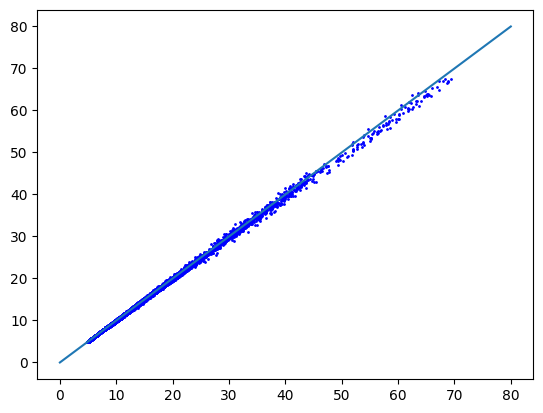

In [32]:
pred_train = net_1.predict(train_input_reshaped)
plt.plot(pred_train.reshape(-1), train_output.reshape(-1),'bo', markersize=1)
plt.plot([0,80],[0,80])

1/1 [==============================] - 4s 4s/step


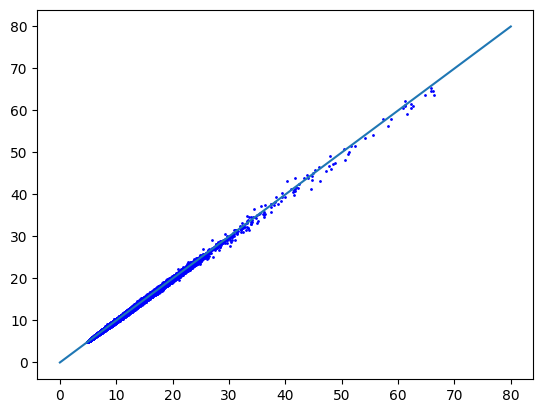

In [33]:
pred_test = net_1.predict(test_input_reshaped)
plt.plot(pred_test.reshape(-1), test_output.reshape(-1),'bo', markersize=1)
plt.plot([0,80],[0,80])

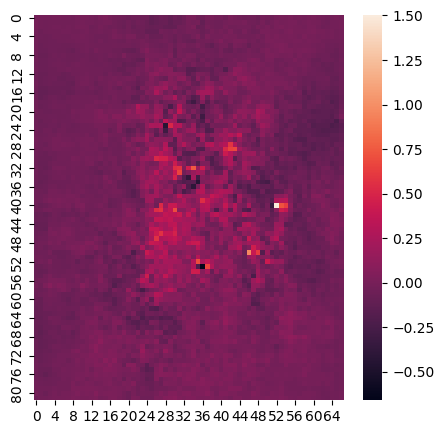

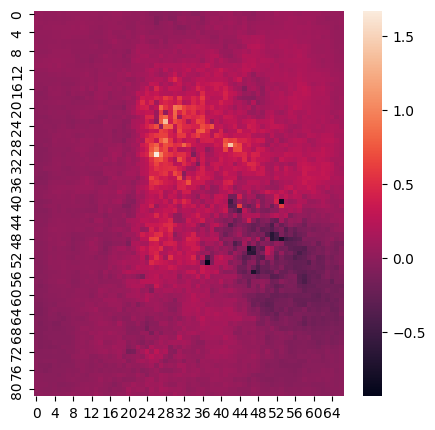

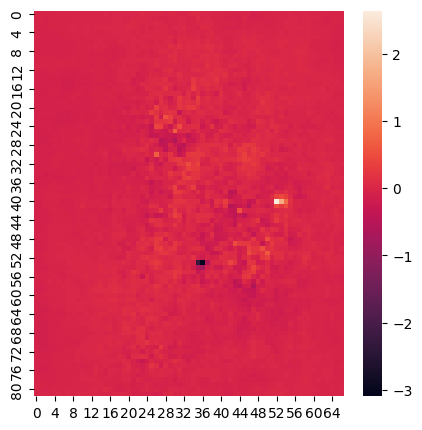

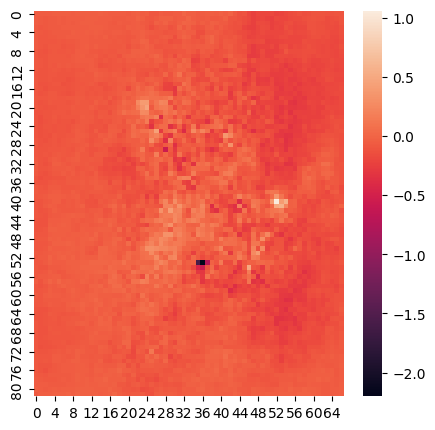

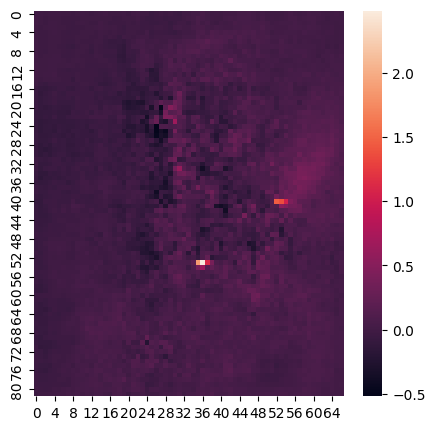

...

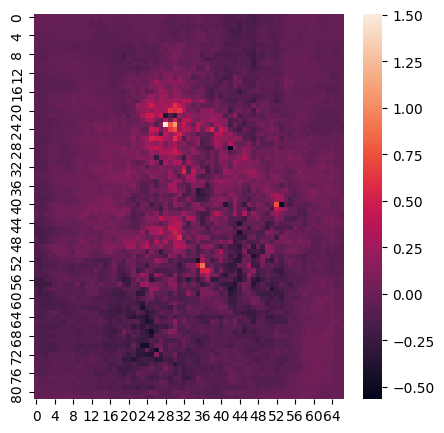

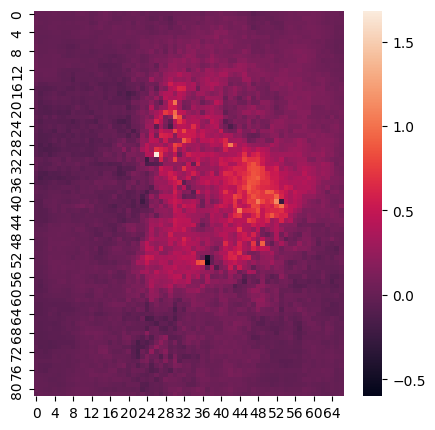

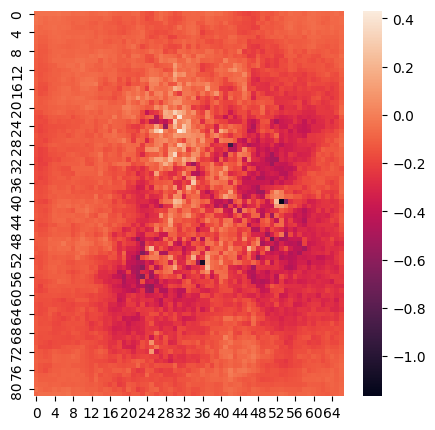

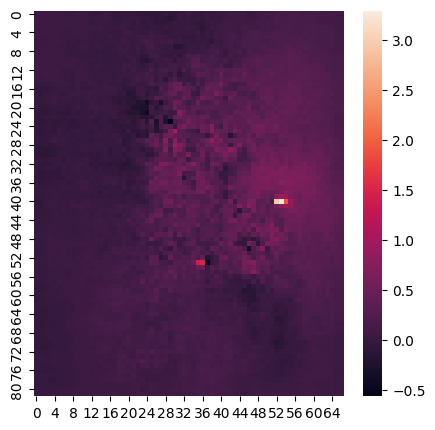

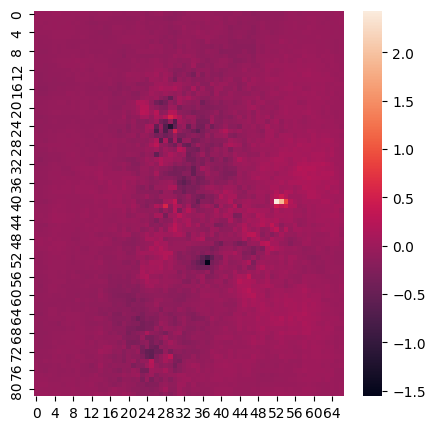

In [34]:
for i in range(len(pred_test)):
    plt.figure(figsize = [5,5])
    sns.heatmap(pred_test[i][:,:,0][::-1] - test_output[i][:,:,0][::-1])

In [35]:
def r_square(y_true, y_pred):
    SS_res = np.sum(np.square(y_true - y_pred))
    SS_tot = np.sum(np.square(y_true - np.mean(y_pred)))
    return (1-SS_res / SS_tot)
# In[]
def NME(y_true, y_pred):
    return np.sum( abs( (y_pred - y_true) / y_true ) ) / len(y_pred)
    

In [36]:
r_sq = []

for i in range(len(pred_train)):
    r_sq.append(r_square(pred_train[i].reshape(-1), train_output[i].reshape(-1)))

print(np.mean(r_sq),np.std(r_sq),np.min(r_sq))

0.999587078562181 7.441196020138465e-05 0.999315774301067


In [37]:
r_sq = []

for i in range(len(pred_test)):
    r_sq.append(r_square(pred_test[i].reshape(-1), test_output[i].reshape(-1)))

print(np.mean(r_sq),np.std(r_sq),np.min(r_sq))

0.9987453353649471 0.0007971558224696556 0.9962907440494746


0.0006056599374032001

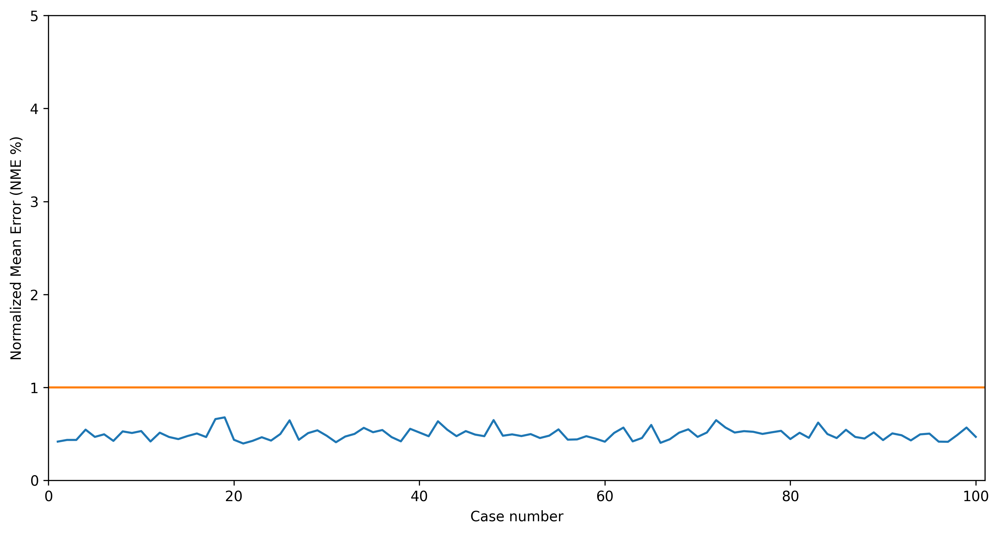

In [38]:
# In[]
result = []
                                                                                                                                                                                                                                                                                                                      
for i in range(len(pred_train)):
    result.append(NME(pred_train[i].reshape(-1), train_output[i].reshape(-1)))
    
# In[]
plt.figure(figsize=(12,6), dpi = 300)
plt.plot(np.arange(1,len(pred_train)+1,1), np.array(result) * 100)
plt.xlim([0,len(pred_train)+1])
plt.ylim([0,5])
plt.plot([0,len(pred_train)+1],[1,1])
plt.xlabel('Case number') ; plt.ylabel('Normalized Mean Error (NME %)')
# In[]
np.max(result)
np.mean(result)
np.std(result)

0.003221183475888154

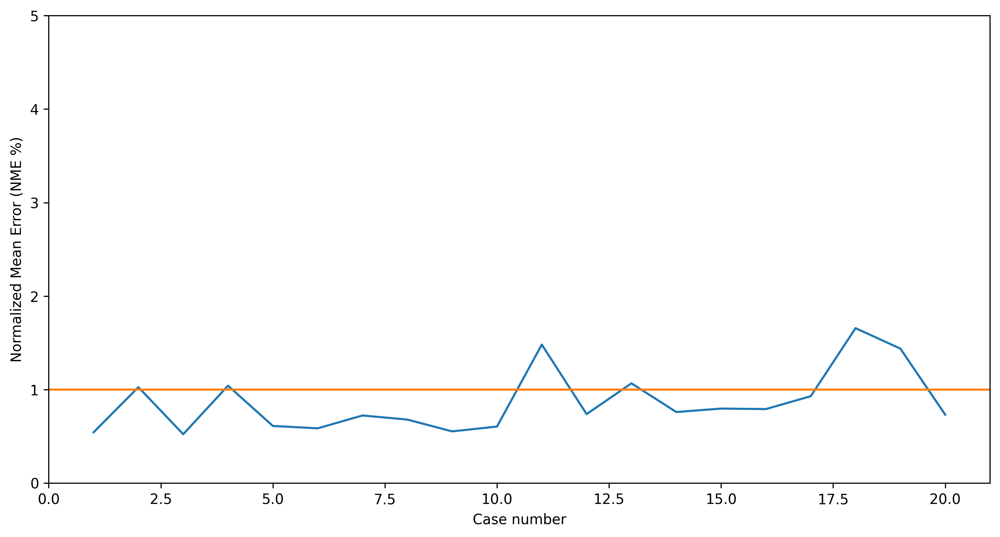

In [39]:
# In[]
result = []
                                                                                                                                                                                                                                                                                                                      
for i in range(len(pred_test)):
    result.append(NME(pred_test[i].reshape(-1), test_output[i].reshape(-1)))
    
# In[]
plt.figure(figsize=(12,6), dpi = 300)
plt.plot(np.arange(1,len(pred_test)+1,1), np.array(result) * 100)
plt.xlim([0,len(pred_test)+1])
plt.ylim([0,5])
plt.plot([0,len(pred_test)+1],[1,1])
plt.xlabel('Case number') ; plt.ylabel('Normalized Mean Error (NME %)')
# In[]
np.max(result)
np.mean(result)
np.std(result)

In [ ]:
# 119 개 시나리오 ratio로 할당해서 퍼지는 분포 확인하기?

# 예측할 sum_region 데이터 샘플 입력?(len 고려)
# len * 119(ratio활용용)의 데이터셋 생성
# predict # len * 119개
# 각 예측값에 대해 119개 샘플을 갖게함
# 분포 고려
# 이론상 예측값 스케일이 커질 수록 벌어지면 베스트

In [ ]:
#
r_smoke_to_smoke_shape_list_by_all_smoke = []
for smoke_i in range(len(smoke_arr)):
    base_smoke = smoke_arr[smoke_i]

    r_smoke_to_smoke_shape_list = []

    for i in r_smoke_dataset.index.tolist():

        chem_base = np.zeros_like(base_smoke)
        for i_c, i_chem in enumerate(smoke_chem_list):

            for pix_index in indexed_grid_point.loc[~indexed_grid_point.CTP_KOR_NM.isna()].index.tolist():
                x, y = pix_index%82, pix_index//82

                region_str = indexed_grid_point.loc[pix_index,'CTP_KOR_NM']
                sum_chem_value = r_smoke_dataset.loc[i, region_str + '_' + i_chem]  # i번시나리오 테스트
                base_smoke_r_sum = r_smoke_dataset.loc[1, region_str + '_' + i_chem]  # 베이스 시나리오이므로 1번 고정
                base_smkoe_r_i_value = base_smoke[x,y,i_c]

                i_value = sum_chem_value * (base_smkoe_r_i_value / base_smoke_r_sum)

                chem_base[x,y,i_c] = i_value
        
        r_smoke_to_smoke_shape_list.append(chem_base)
    
    r_smoke_to_smoke_shape_list_by_all_smoke.append(r_smoke_to_smoke_shape_list)
    print(smoke_i)

In [60]:
reshaped_dataset = np.zeros([len(r_smoke_to_smoke_shape_list_by_all_smoke[0]),len(r_smoke_to_smoke_shape_list_by_all_smoke),82,67,6])

for sample_i in range(len(reshaped_dataset)):

    for base_map_i in range(len(reshaped_dataset[0])):

        reshaped_dataset[sample_i, base_map_i, :, :, :] = r_smoke_to_smoke_shape_list_by_all_smoke[base_map_i][sample_i]



In [ ]:
#

4/4 [==============================] - 0s 90ms/step


/tmp/ipykernel_3791518/1970062841.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize = [5,5])


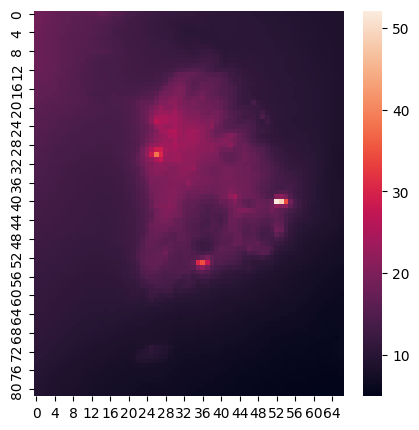

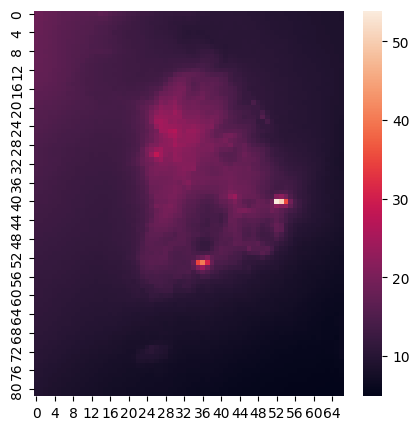

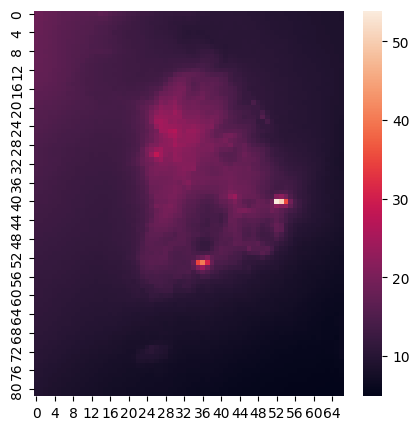

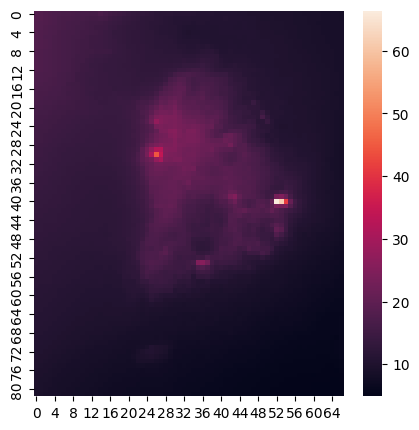

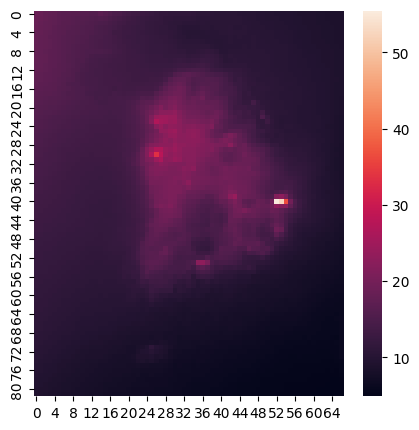

...

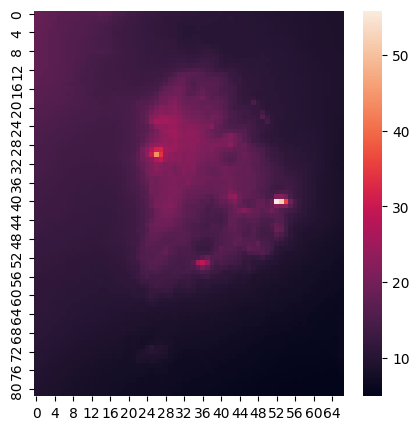

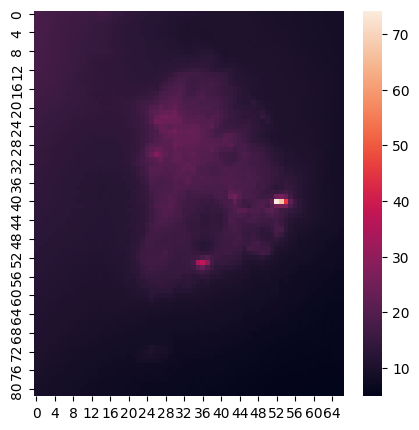

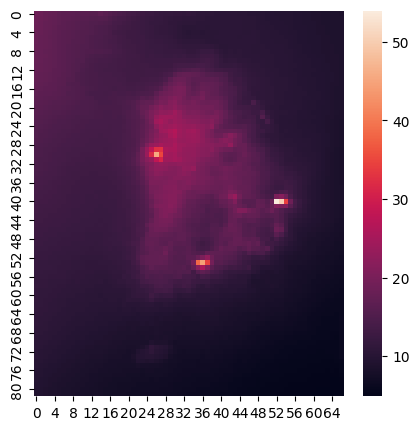

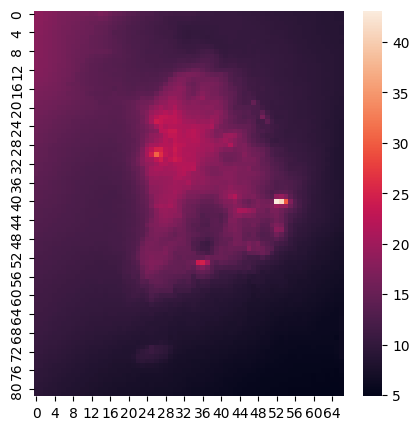

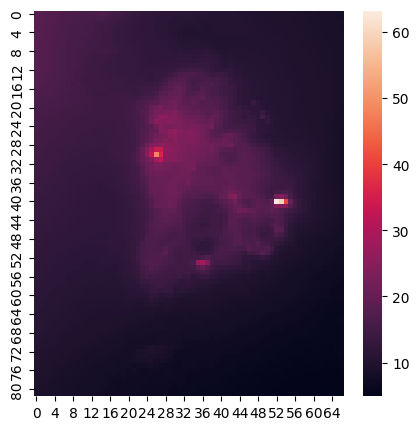

In [65]:
pred_119_ratio = net_1.predict(reshaped_dataset[0])
for i in range(len(pred_119_ratio)): 
    plt.figure(figsize = [5,5])
    sns.heatmap(pred_119_ratio[i][:,:,0][::-1])

1/1 [==============================] - 0s 21ms/step


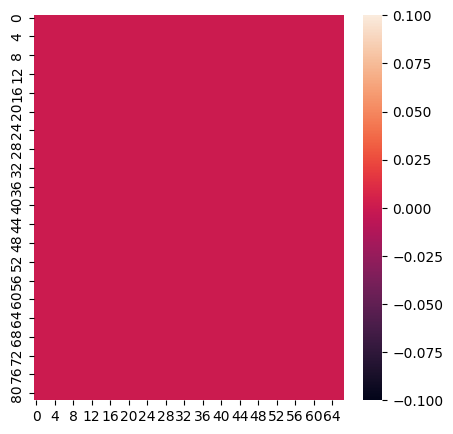

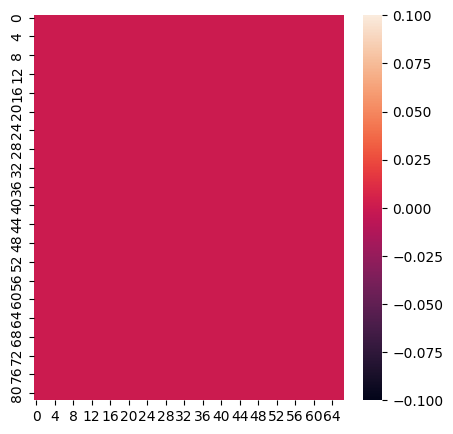

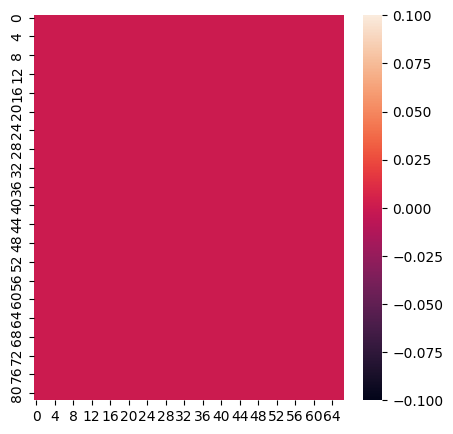

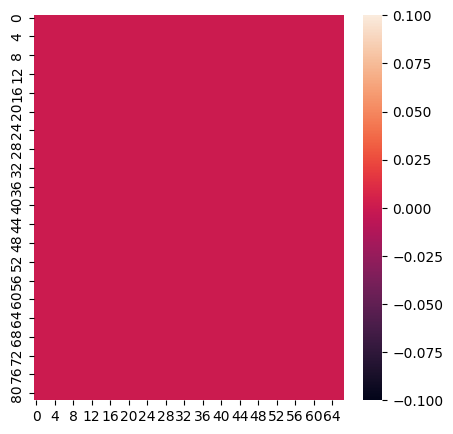

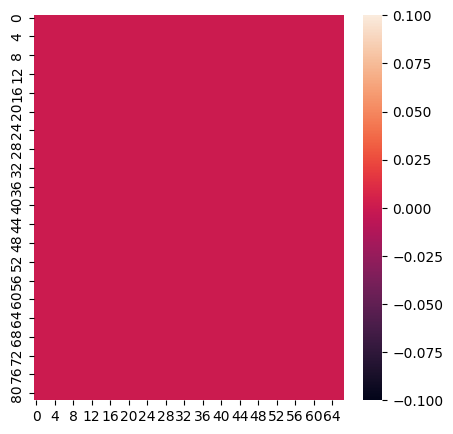

...

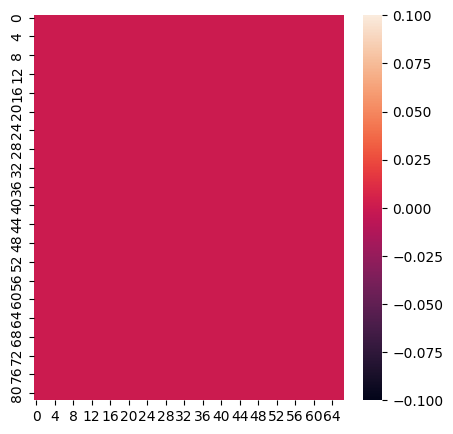

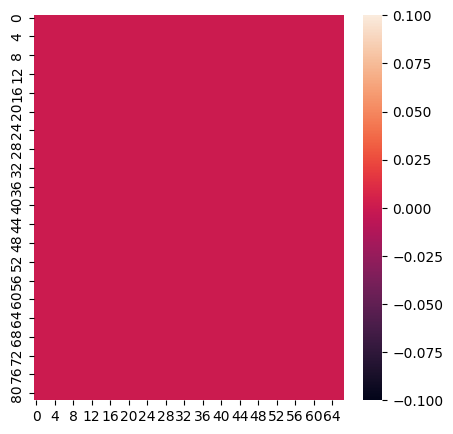

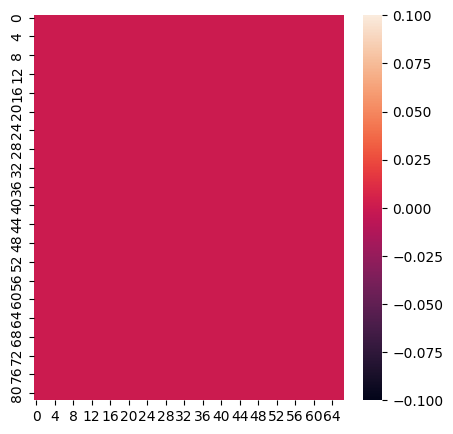

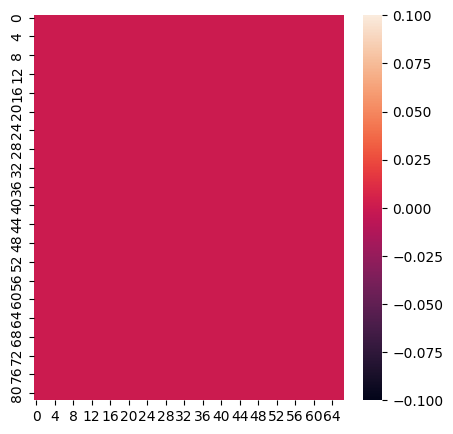

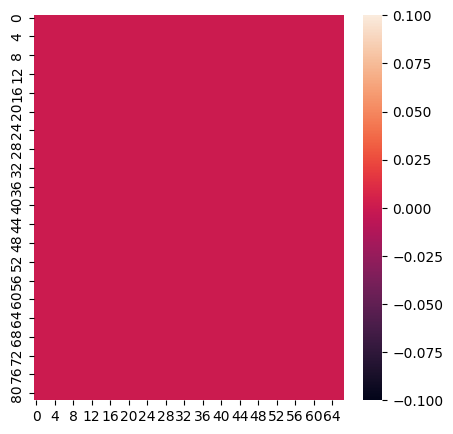

In [75]:
# 리쉐이프 등 정리 잘 되었나 확인용
pred_test = net_1.predict(test_input_reshaped)
pred_test_check = net_1.predict(reshaped_dataset[100:,0,:,:,:])   # 0번 베이스 스모크로 정리한 데이터셋
differ_arr = pred_test - pred_test_check

for i in range(len(differ_arr)):
    plt.figure(figsize = [5,5])
    sns.heatmap(differ_arr[i][:,:,0][::-1])